In [99]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE  # imblearn library can be installed using pip install imblearn
from imblearn.pipeline import Pipeline

In [148]:
# Importing our datasets
train = pd.read_csv("data-science-nigeria-bank-campaign-subscriptions/train.csv")
test = pd.read_csv("data-science-nigeria-bank-campaign-subscriptions/test.csv")
sample_submission = pd.read_csv("data-science-nigeria-bank-campaign-subscriptions/sample_submission.csv")

In [149]:
train.head()

,customer_id,age,job,marital,education,default,housing,loan,contact,month,...,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,subscribed
0,customer_id_39075,31,admin.,married,university.degree,no,no,no,cellular,dec,...,3,999,1,failure,-2.97,46.3565,-23.10,1.711,5023.5,0
1,customer_id_34855,31,technician,single,university.degree,no,no,no,telephone,may,...,4,999,0,nonexistent,-1.77,46.4465,-32.34,2.252,5099.1,0
2,customer_id_7107,47,blue-collar,married,basic.6y,unknown,yes,no,telephone,may,...,2,999,0,nonexistent,1.13,46.9970,-25.48,5.862,5191.0,0
3,customer_id_31614,36,services,married,university.degree,no,no,no,cellular,may,...,1,999,1,failure,-1.77,46.4465,-32.34,2.329,5099.1,0
4,customer_id_34878,34,admin.,single,high.school,no,no,no,cellular,may,...,9,999,0,nonexistent,-1.77,46.4465,-32.34,2.252,5099.1,0


In [150]:
test.head()

,customer_id,age,job,marital,education,default,housing,loan,contact,month,...,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed
0,customer_id_32884,59,technician,married,high.school,no,no,yes,cellular,may,...,6.183333,1,999,1,failure,-1.77,46.4465,-32.34,2.301,5099.1
1,customer_id_3169,57,unknown,married,unknown,unknown,yes,no,telephone,may,...,4.750000,2,999,0,nonexistent,1.13,46.9970,-25.48,5.862,5191.0
2,customer_id_32206,35,blue-collar,married,basic.9y,no,no,no,cellular,may,...,0.866667,1,999,1,failure,-1.77,46.4465,-32.34,2.315,5099.1
3,customer_id_9403,38,admin.,married,high.school,no,no,no,telephone,jun,...,5.916667,4,999,0,nonexistent,1.43,47.2325,-29.26,5.969,5228.1
4,customer_id_14020,29,housemaid,married,high.school,no,yes,no,cellular,jul,...,3.150000,2,999,0,nonexistent,1.43,46.9590,-29.89,5.965,5228.1


In [151]:
sample_submission.head()

,customer_id,subscribed
0,customer_id_32884,1
1,customer_id_3169,1
2,customer_id_32206,1
3,customer_id_9403,1
4,customer_id_14020,1


In [152]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28831 entries, 0 to 28830
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   customer_id     28831 non-null  object 
 1   age             28831 non-null  int64  
 2   job             28831 non-null  object 
 3   marital         28831 non-null  object 
 4   education       28831 non-null  object 
 5   default         28831 non-null  object 
 6   housing         28831 non-null  object 
 7   loan            28831 non-null  object 
 8   contact         28831 non-null  object 
 9   month           28831 non-null  object 
 10  day_of_week     28831 non-null  object 
 11  duration        28831 non-null  float64
 12  campaign        28831 non-null  int64  
 13  pdays           28831 non-null  int64  
 14  previous        28831 non-null  int64  
 15  poutcome        28831 non-null  object 
 16  emp_var_rate    28831 non-null  float64
 17  cons_price_idx  28831 non-null 

In [153]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12357 entries, 0 to 12356
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   customer_id     12357 non-null  object 
 1   age             12357 non-null  int64  
 2   job             12357 non-null  object 
 3   marital         12357 non-null  object 
 4   education       12357 non-null  object 
 5   default         12357 non-null  object 
 6   housing         12357 non-null  object 
 7   loan            12357 non-null  object 
 8   contact         12357 non-null  object 
 9   month           12357 non-null  object 
 10  day_of_week     12357 non-null  object 
 11  duration        12357 non-null  float64
 12  campaign        12357 non-null  int64  
 13  pdays           12357 non-null  int64  
 14  previous        12357 non-null  int64  
 15  poutcome        12357 non-null  object 
 16  emp_var_rate    12357 non-null  float64
 17  cons_price_idx  12357 non-null 

In [154]:
sample_submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12357 entries, 0 to 12356
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   customer_id  12357 non-null  object
 1   subscribed   12357 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 193.2+ KB


In [155]:
target = [col for col in train.columns if col not in test.columns]
target

['subscribed']

In [156]:
# for col in train.columns:
#     if col not in test.colunms:
#         print(col)

In [157]:
missing_data = train.isnull().sum()

In [158]:
missing_data[missing_data > 0]

Series([], dtype: int64)

In [27]:
from pandas_profiling import ProfileReport
ProfileReport(train)

In [30]:
ProfileReport(test)

0    25580
1     3251
Name: subscribed, dtype: int64



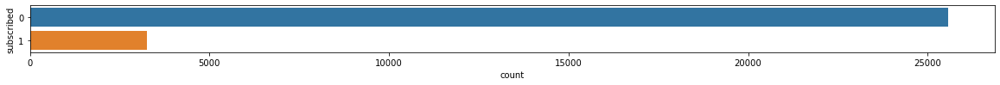

In [159]:
# How many people subcribed
print(train.subscribed.value_counts())
print()

plt.figure(figsize = (20,1))
sns.countplot(y="subscribed", data=train)
plt.show()

In [34]:
train.dtypes

customer_id        object
age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration          float64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp_var_rate      float64
cons_price_idx    float64
cons_conf_idx     float64
euribor3m         float64
nr_employed       float64
subscribed          int64
dtype: object

In [160]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
# cat_cols = train.iloc[:, [0,2:11]]
cat_cols = [ "marital", "job", "education", "default", "housing", "loan", "contact", "month", "day_of_week","poutcome","customer_id"]
for col in  cat_cols:
    train[col] = le.fit_transform(train[col])
    test[col] = le.fit_transform(test[col])

In [161]:
from sklearn.model_selection import train_test_split

In [162]:
X = train.drop("subscribed", axis=1)
y = train["subscribed"]

In [176]:
# Implementing Oversampling to balance the dataset; SMOTE stands for Synthetic Minority Oversampling TEchnique
print("Number of observations in each class before oversampling (training data): \n", pd.Series(y_train).value_counts())

smote = SMOTE(random_state = 101)
X_train,y_train = smote.fit_sample(X_train,y_train)

print("Number of observations in each class after oversampling (training data): \n", pd.Series(y_train).value_counts())

Number of observations in each class before oversampling (training data): 
 0    20435
1     2629
Name: subscribed, dtype: int64
Number of observations in each class after oversampling (training data): 
 1    20435
0    20435
Name: subscribed, dtype: int64


In [177]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 50)

In [181]:
train.head()

,customer_id,age,job,marital,education,default,housing,loan,contact,month,...,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,subscribed
0,22631,31,0,1,6,0,0,0,0,2,...,3,999,1,0,-2.97,46.3565,-23.10,1.711,5023.5,0
1,19384,31,9,2,6,0,0,0,1,6,...,4,999,0,1,-1.77,46.4465,-32.34,2.252,5099.1,0
2,26598,47,1,1,1,1,2,0,1,6,...,2,999,0,1,1.13,46.9970,-25.48,5.862,5191.0,0
3,16868,36,7,1,6,0,0,0,0,6,...,1,999,1,0,-1.77,46.4465,-32.34,2.329,5099.1,0
4,19400,34,0,2,3,0,0,0,0,6,...,9,999,0,1,-1.77,46.4465,-32.34,2.252,5099.1,0


In [182]:
from sklearn.ensemble import GradientBoostingClassifier
GBclassifier = GradientBoostingClassifier()
GBclassifier.fit(X_train, y_train)

GradientBoostingClassifier()

In [183]:
Gb_prediction = GBclassifier.predict(X_test)

In [184]:
def ConfusionMatrix(ytest, ypred, label = ["Negative", "Positive"]):
    "A beautiful confusion matrix function to check the model performance"
    from sklearn.metrics import confusion_matrix
    import seaborn as sns
    cm = confusion_matrix(ytest, ypred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot = True, cbar = False, fmt = 'd', cmap = 'winter')
    plt.xlabel('Predicted', fontsize = 13)
    plt.xticks([0.5, 1.5], label)
    plt.yticks([0.5, 1.5], label)
    plt.ylabel('Truth', fontsize = 13)
    plt.title('A confusion matrix');

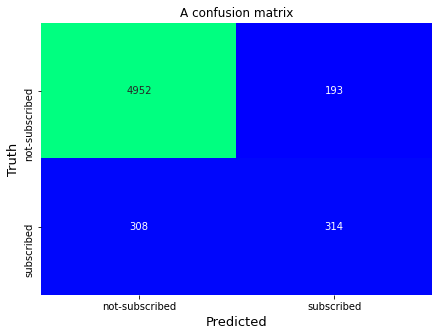

In [185]:
ConfusionMatrix(y_test, Gb_prediction, label= ["not-subscribed", "subscribed"])

In [186]:
from sklearn.metrics import accuracy_score, f1_score
accuracy_score(y_test, Gb_prediction)

0.9131264088780995

In [187]:
f1_score(y_test, Gb_prediction)

0.5562444641275465

In [188]:
test_pred = GBclassifier.predict(test)

In [189]:
test_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [190]:
accuracy_score(y_train, GBclassifier.predict(X_train))

0.9235605272285813

In [112]:
submission = sample_submission
submission.subscribed = test_pred
submission.head()

,customer_id,subscribed
0,customer_id_32884,0
1,customer_id_3169,0
2,customer_id_32206,0
3,customer_id_9403,0
4,customer_id_14020,0


In [113]:
submission.to_csv("my sixth submission.csv", index = False)

In [115]:
from sklearn.neighbors import KNeighborsClassifier
model_kn = KNeighborsClassifier()

In [117]:
model_kn.fit(X_train, y_train)
predict_log= model_kn.predict(X_test)

In [119]:
predict_log

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [174]:
from sklearn.metrics import accuracy_score, f1_score
accuracy_score(y_test, predict_log)

0.8992543783596324

In [192]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred4 = logreg.predict(X_test)
acc_log = round(logreg.score(X_train, y_train) * 100, 2)
acc_log

C:\Users\Ardor\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


90.36

In [133]:
test_pred = logreg.predict(test)

In [134]:
test_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [135]:
submission = sample_submission
submission.subscribed = test_pred
submission.head()

,customer_id,subscribed
0,customer_id_32884,0
1,customer_id_3169,0
2,customer_id_32206,0
3,customer_id_9403,0
4,customer_id_14020,0


In [138]:
submission.to_csv("my ninth submission.csv", index = False)

In [194]:
grid_param = {'classification__kernel': ['linear','poly','rbf','sigmoid'], 'classification__C': [.001,.01,.1,1,10,100]}
grid_param

{'classification__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
 'classification__C': [0.001, 0.01, 0.1, 1, 10, 100]}

In [191]:
from sklearn.svm import SVC
svc = SVC()
svc.fit(X_train, y_train)
test_pred = svc.predict(test)
acc_svc = round(svc.score(X_train, y_train) * 100, 2)
acc_svc

89.69

In [144]:
test_pred = logreg.predict(test)

In [145]:
test_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [146]:
submission = sample_submission
submission.subscribed = test_pred
submission.head()

,customer_id,subscribed
0,customer_id_32884,0
1,customer_id_3169,0
2,customer_id_32206,0
3,customer_id_9403,0
4,customer_id_14020,0


In [147]:
submission.to_csv("my tenth submission.csv", index = False)